# Question 4

**_Delay differential equations and sensitivity analysis._** _For the delay differential equation model found at: https://github.com/maclean-lab/ModelingMDSCs, simulate the model for a time span of [0, 400] for the three different parameter regimes listed in the table below. Simulate each regime at least 3 times, each with a different delay parameter τ ∈ [0, 365] days. For each parameter regime used, perform a parameter sensitivity analysis. You should present your results in a sensible way and state the three most sensitive parameters in each case. Explain in your own words the impact that they have both mathematically (impact on the equations) and biologically (impact on the tumor microenvironment)._


We started by defining our DDE models using different values of $\tau$. Based on Jesse’s paper, we opted for $\tau = (10, 100, 365)$.

For each regime, we used the parameters defined in the question. As Jesse described in class, we can see that lower delays result in more noticeable impacts on cell populations.

Regime 1 showed pretty smooth curves, while Regime 2 was kind of wobbly and Regime 3 showed pretty immediate plateaus.

When we ran parameter sensitivity on all three regimes, we found slightly different results for each.

For Regime 1, we saw that tumor cells, MDSCs, and CTL cells were most sensitive to $\beta_1,\beta_2,$ and $\alpha_6$. NK cells were also slightly sensitive to these parameters, but were super sensitive to $\beta_3$.

In terms of the significance of these parameters, we have $\beta_1$ is the tumor cells kill rate by NK cells; $\beta_2$ is the tumor cells kill rate by T cells; $\alpha_6$ is the CTL stimulation as a result of tumor-NK cell interaction; $\beta_3$ is the NK cells inactivation rate by MDSCs. It makes sense that CTL cells are most sensitive to the parameter with CTL stimulation, and of course NK cells are sensitive to NK cells inactivation rate, so these sensitivity values make a lot of sense.

For Regime 2, we still have tumor cells being sensitive to $\beta_1$ and $\beta_2$, with minor sensitivities to $\zeta_1$, $\beta_3$, and $\beta_4$. $\zeta_1$ is the tumor cell death rate, so it makes sense that tumor cells are sensitive to this parameter. MDSCs are sensitive to $\beta_1$ and $\zeta_1$; NK cells are only sensitive to $\beta_3$, and CTL cells are sensitive to all the $\beta$ parameters.

Regime 3 is where we see some wildcards. We still have all the $\beta$’s playing a big role, with an appearance from $\zeta_2$, the MDSC death rate, in the MDSC parameters.

Overall, it’s interesting that the pretty minor changes between Regimes 1 and 2 resulting in some pretty different sensitivity results, and I’m actually a bit surprised that Regime 3 isn’t more different. In general, I think all the parameters than each cell type is sensitive to makes a lot of sense in terms of the tumor microenvironment more broadly.


## DDE Models


In [1]:
using DifferentialEquations
using Plots
using GlobalSensitivity
using Statistics
import Random

#define model with delay
function dde_system(du,u,h,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄ = p
    histC_MDSC = h(p, t-τ; idxs=1)

    # Cancer cells (tumor)
    du[1] = dT = α₁*T*log(η/T) - β₁*T*NK - β₂*T*CTL - ζ₁*T
    # MDSCs 
    du[2] = dMDSC = α₂ + α₃*histC_MDSC/(γ₁+(histC_MDSC)) - ζ₂*MDSC 
    # NK cells
    du[3] = dNK = α₄ + α₅*(T^2)/(γ₂+(T^2)) - β₃*MDSC*NK - ζ₃*NK 
    # CTL cells
    du[4] = dCTL = α₆*T*NK + α₇*(T^2)/(γ₃+(T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

#define initial number of tumor cells for delay model
h(p, t; idxs = nothing) = typeof(idxs) <: Number ? 1.0 : ones(4)
alg_ODE = Tsit5();
alg_DDE = MethodOfSteps(Tsit5());
tspan = (0.0, 400.0);

τ1 = 10
τ2 = 50
τ3 = 365

365

### Regime 1


In [2]:
# regime 1
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 1.4*(10.0^4.0) #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p_1 = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
u0_1 = [1.0; α₂/ζ₂; ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃); 0.0];

In [3]:
τ = 10
τ1_prob_1 = DDEProblem(dde_system, u0_1, h, tspan, p_1; constant_lags = [τ]);
τ1_sol_1 = solve(τ1_prob_1, alg_DDE);

τ = 50
τ2_prob_1 = DDEProblem(dde_system, u0_1, h, tspan, p_1; constant_lags = [τ]);
τ2_sol_1 = solve(τ2_prob_1, alg_DDE);

τ = 365
τ3_prob_1 = DDEProblem(dde_system, u0_1, h, tspan, p_1; constant_lags = [τ]);
τ3_sol_1 = solve(τ3_prob_1, alg_DDE);

In [4]:
τ1 = 10
τ2 = 50
τ3 = 365
labels = ["Tumor" "MDSC" "NK" "CTL"]

τ1_plot_1 = plot(τ1_sol_1, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 1, τ = $τ1)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2, 
                legend=:bottomright, label=labels)

τ2_plot_1 = plot(τ2_sol_1, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 1, τ = $τ2)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels)

τ3_plot_1 = plot(τ3_sol_1, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 1, τ = $τ3)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2, 
                legend=:bottomright, label=labels);

### Regime 2


In [5]:
# regime 2
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 10.0^3.0 #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p_2 = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
u0_2 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0];

In [6]:
τ1 = 10
τ2 = 50
τ3 = 365

τ = 10
τ1_prob_2 = DDEProblem(dde_system, u0_2, h, tspan, p_2); constant_lags = [τ];
τ1_sol_2 = solve(τ1_prob_2, alg_DDE);

τ = 50
τ2_prob_2 = DDEProblem(dde_system, u0_2, h, tspan, p_2; constant_lags = [τ]);
τ2_sol_2 = solve(τ2_prob_2, alg_DDE);

τ = 365
τ3_prob_2 = DDEProblem(dde_system, u0_2, h, tspan, p_2; constant_lags = [τ]);
τ3_sol_2 = solve(τ3_prob_2, alg_DDE);

In [7]:
τ1_plot_2 = plot(τ1_sol_2, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 2, τ = $τ1)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels)

τ2_plot_2 = plot(τ2_sol_2, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 2, τ = $τ2)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels)

τ3_plot_2 = plot(τ3_sol_2, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 2, τ = $τ3)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels);

### Regime 3


In [8]:
# regime 3
# set model parameters
α₂ = 5.0 * (10.0^2.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 6.0 * (10.0^(-4.0)) #tumor cells kill rate by NK cells
β₂ = 7.0 * (10.0^(-4.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 5.0 * 10.0 #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 4.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p_3 = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄)
u0_3 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0];

In [9]:
τ = 10
τ1_prob_3 = DDEProblem(dde_system, u0_3, h, tspan, p_3); constant_lags = [τ];
τ1_sol_3 = solve(τ1_prob_3, alg_DDE);

τ = 50
τ2_prob_3 = DDEProblem(dde_system, u0_3, h, tspan, p_3; constant_lags = [τ]);
τ2_sol_3 = solve(τ2_prob_3, alg_DDE);

τ = 365
τ3_prob_3 = DDEProblem(dde_system, u0_3, h, tspan, p_3; constant_lags = [τ]);
τ3_sol_3 = solve(τ3_prob_3, alg_DDE);

In [10]:
τ1 = 10
τ2 = 50
τ3 = 365

τ1_plot_3 = plot(τ1_sol_3, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 3, τ = $τ1)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels)

τ2_plot_3 = plot(τ2_sol_3, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 3, τ = $τ2)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels)

τ3_plot_3 = plot(τ3_sol_3, 
                yaxis=:log,size =(1600/2,600), ylims = (0.01,10^7.5),
                title = "Cell Populations over Time\n(Regime 3, τ = $τ3)",
                xlabel = "Time (days)", ylabel = "Population", lw = 2,
                legend=:bottomright, label=labels);

### Plots


┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots C:\Users\lexis\.julia\packages\Plots\kLeqV\src\utils.jl:106
┌ Warning: Invalid neg

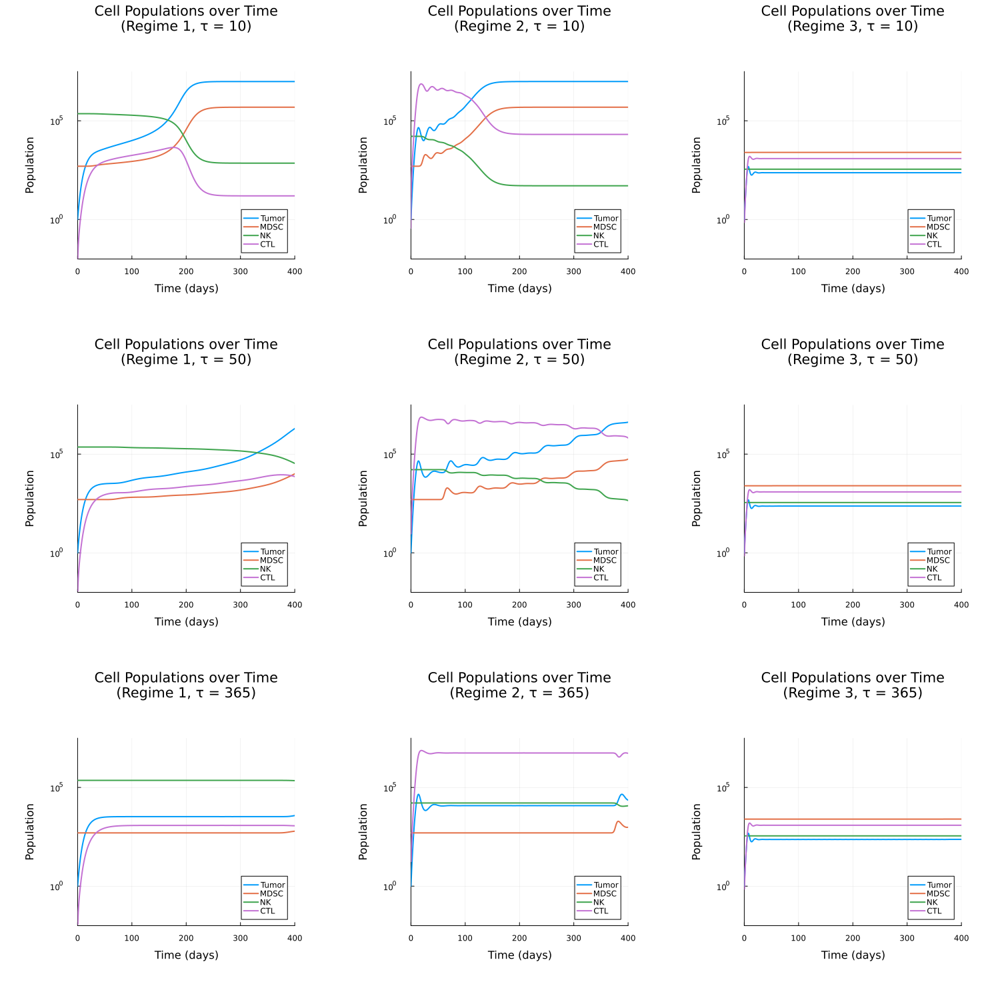

In [11]:
plots = [τ1_plot_1, τ1_plot_2, τ1_plot_3, τ2_plot_1, τ2_plot_2, τ2_plot_3, τ3_plot_1, τ3_plot_2, τ3_plot_3]
plot(plots..., layout = (3, 3), size = (1500, 1500), margin = 50Plots.px)

## Sensitivity Analysis


In [12]:
using DifferentialEquations
using GlobalSensitivity
using Plots

function ode_model(du,u,p,t)
    T,MDSC,NK,CTL = u
    α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃ = p

    # Cancer cells (tumor)
    du[1] = α₁*T*log(max(η/T,1)) - β₁*T*NK - β₂*T*CTL - ζ₁*T 
    # MDSCs 
    du[2] = α₂ + α₃*T/(γ₁ + T) - ζ₂*MDSC 
    # NK cells
    du[3] = α₄ + α₅*(T^2)/(γ₂ + (T^2)) - β₃*MDSC*NK - ζ₃*NK 
    # CTL cells
    du[4] = α₆*T*NK + α₇*(T^2)/(γ₃ + (T^2)) - β₄*MDSC*CTL - ζ₄*CTL
end

ode_model (generic function with 1 method)

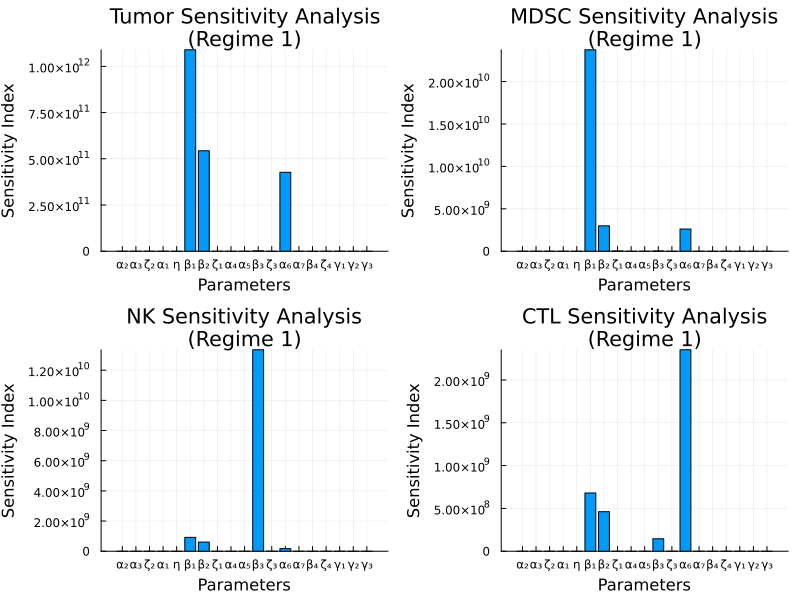

In [13]:
# regime 1 
α₂ = 10.0*(10.0^1.0) # MDSCs production rate
α₃ = (10.0^8.0)      # MDSCs expansion coefficient 
ζ₂ = 0.2             # MDSCs death rate

α₁ = 10.0^(-1.0)     # Tumor growth rate
η = 10.0^7.0         # Tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) # Tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) # Tumor cells kill rate by T cells
ζ₁ = 0.0             # Tumor cell death rate

α₄ = 1.4*(10.0^4.0)  # NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) # NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) # NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) # NK cells death rate

α₆ = 1.1*(10.0^(-7.0)) # CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0)      # CTL expansion coefficient 
β₄ = (10.0^(-4.0))    # CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) # CTL death rate

γ₁ = (10.0^(10.0))    # Steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) # Steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) # Steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃)
tspan = (0.0,1000.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

function model_output(p)
    prob = ODEProblem(ode_model, u0, tspan, p)
    sol = solve(prob, Rosenbrock23(), saveat=1000.0)
    final_values = sol[end]
    return final_values
end

# parameter ranges
param_ranges = [ [0.0, 10.0^(3.0)],
    [10.0^(7.0), 10.0^(9.0)],
    [0.0, 1.0],
    [10.0^(-2.0), 5*10.0^(-1.0)],
    [10.0^(6.0), 10.0^(8.0)],
    [10.0^(-7.0), 10.0^(-6.0)],
    [10.0^(-7.0), 10.0^(-6.0)],
    [0.0, 0.1],
    [10.0^(3.0), 10.0^(5.0)],
    [10.0^(-2.0), 10.0^(-1.0)],
    [10.0^(-5.0), 10.0^(-4.0)],
    [10.0^(-2.0), 10.0^(-1.0)],
    [10.0^(-7.0), 10.0^(-6.0)],
    [5*10.0^(-2.0), 10.0^(-1.0)],
    [5*10.0^(-5.0), 5*10.0^(-4.0)],
    [10.0^(-2.0), 10.0^(-1.0)],
    [10.0^(9.0), 10.0^(11.0)],
    [10.0^(6.0), 10.0^(8.0)],
    [10.0^(6.0), 10.0^(8.0)] ]

sensitivity_analysis = gsa(model_output, Morris(total_num_trajectory=200, num_trajectory=20), param_ranges)

param_names = [:α₂, :α₃, :ζ₂, :α₁, :η, :β₁, :β₂, :ζ₁, :α₄, :α₅, :β₃, :ζ₃, :α₆, :α₇, :β₄, :ζ₄, :γ₁, :γ₂, :γ₃]
cell_types = ["Tumor", "MDSC", "NK", "CTL"]
sensitivity_plots = []

for i in 1:4
    param_plot = bar(sensitivity_analysis.means_star[i, :],
                     xticks=(1:19, param_names),
                     title="$(cell_types[i]) Sensitivity Analysis\n(Regime 1)",
                     legend=false,
                     xlabel="Parameters",
                     ylabel="Sensitivity Index")
    push!(sensitivity_plots, param_plot)
end

plot(sensitivity_plots..., layout=(2, 2), size=(800, 600))


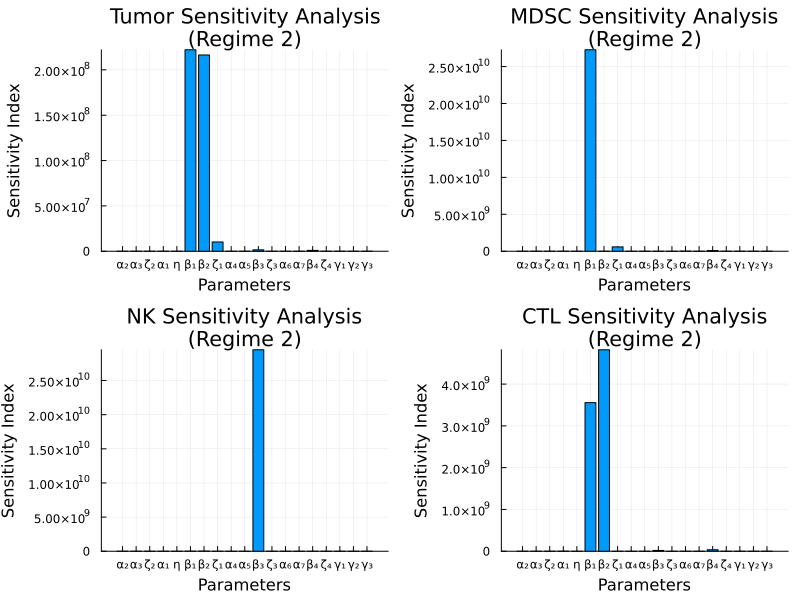

In [14]:
# regime 2
#set model parameters
α₂ = 10.0*(10.0^1.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 3.5*(10.0^(-6.0)) #tumor cells kill rate by NK cells
β₂ = 1.1*(10.0^(-7.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 10.0^3.0 #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 2.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve

p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃)
tspan = (0.0,1000.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

function model_output(p)
    prob = ODEProblem(ode_model, u0, tspan, p)
    sol = solve(prob, Rosenbrock23(), saveat=1000.0)
    final_values = sol[end]
    return final_values
end

param_ranges = [[10.0, 10.0^(3.0)],
    [10.0^(7.0), 10.0^(9.0)],
    [0.0, 1.0],
    [10.0^(-3.0), 10.0^(-1.0)],
    [10.0^(6.0), 10.0^(8.0)],
    [10.0^(-7.0), 10.0^(-5.0)],
    [10.0^(-7.0), 10.0^(-5.0)],
    [0.0, 0.1],
    [10.0^(2.0), 10.0^(4.0)],
    [10.0^(-3.0), 10.0^(-1.0)],
    [10.0^(-6.0), 10.0^(-4.0)],
    [10.0^(-3.0), 10.0^(-1.0)],
    [10.0^(-4.0), 10.0^(-2.0)],
    [10.0^(-2.0), 10.0^(-1.0)],
    [10.0^(-5.0), 10.0^(-3.0)],
    [10.0^(-3.0), 10.0^(-1.0)],
    [10.0^(9.0), 10.0^(11.0)],
    [10.0^(6.0), 10.0^(8.0)],
    [10.0^(6.0), 10.0^(8.0)]]

sensitivity_analysis = gsa(model_output, Morris(total_num_trajectory=200, num_trajectory=20), param_ranges)

param_names = [:α₂, :α₃, :ζ₂, :α₁, :η, :β₁, :β₂, :ζ₁, :α₄, :α₅, :β₃, :ζ₃, :α₆, :α₇, :β₄, :ζ₄, :γ₁, :γ₂, :γ₃]
cell_types = ["Tumor", "MDSC", "NK", "CTL"]
sensitivity_plots = []

for i in 1:4
    param_plot = bar(sensitivity_analysis.means_star[i, :],
                     xticks=(1:19, param_names),
                     title="$(cell_types[i]) Sensitivity Analysis\n(Regime 2)",
                     legend=false,
                     xlabel="Parameters",
                     ylabel="Sensitivity Index")
    push!(sensitivity_plots, param_plot)
end

plot(sensitivity_plots..., layout=(2, 2), size=(800, 600))


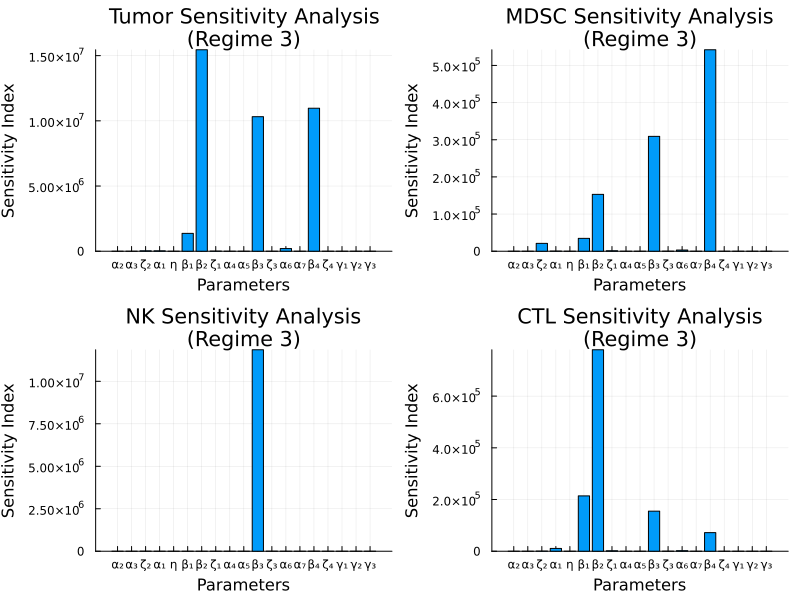

In [15]:
# regime 3
α₂ = 5.0 * (10.0^2.0) #MDSCs production rate
α₃ = (10.0^8.0) #MDSCs expansion coefficient 
ζ₂ = 0.2 #MDSCs death rate

α₁ = 10.0^(-1.0) #tumor growth rate
η = 10.0^7.0 #tumor maximum size
β₁ = 6.0 * (10.0^(-4.0)) #tumor cells kill rate by NK cells
β₂ = 7.0 * (10.0^(-4.0)) #tumor cells kill rate by T cells
ζ₁ = 0.0 #tumor cell death rate

α₄ = 5.0 * 10.0 #NK cells production rate
α₅ = 2.5*(10.0^(-2.0)) #NK cells expansion coefficient
β₃ = 4*(10.0^(-5.0)) #NK cells inactivation rate by MDSCs
ζ₃ = 4.12*(10.0^(-2.0)) #NK cells death rate

α₆ = 4.0*(10.0^(-3.0)) #CTL stimulation as a result of tumor-NK cell interaction
α₇ = 10.0^(-1.0) #CTL expansion coefficient 
β₄ = (10.0^(-4.0)) #CTL inactivation rate by MDSCs
ζ₄ = 2.0*(10.0^(-2.0)) #CTL death rate

γ₁ = (10.0^(10.0)) #steepness coefficient of MDSC production curve
γ₂ = 2.02*(10.0^(7.0)) #steepness coefficient of NK production curve
γ₃ = 2.02*(10.0^(7.0)) #steepness coefficient of CTL production curve


p = (α₂,α₃,ζ₂,α₁,η,β₁,β₂,ζ₁,α₄,α₅,β₃,ζ₃,α₆,α₇,β₄,ζ₄,γ₁,γ₂,γ₃)
tspan = (0.0,1000.0)
u0 = [1.0;α₂/ζ₂;ζ₂*α₄/(α₂*β₃+ζ₂*ζ₃);0.0]

function model_output(p)
    prob = ODEProblem(ode_model, u0, tspan, p)
    sol = solve(prob, Rosenbrock23(), saveat=1000.0)
    final_values = sol[end]
    return final_values
end

param_ranges = [[10.0^(2.0), 5.0 * (10.0^(3.0))],
            [10.0^(7.0), 10.0^(9.0)],
            [0.1, 1.0],
            [10.0^(-2.0), 10.0^(-1.0)],
            [10.0^(6.0), 10.0^(8.0)],
            [10.0^(-4.0), 10.0^(-3.0)],
            [10.0^(-4.0), 10.0^(-3.0)],
            [0.01, 0.1],
            [10.0, 10.0^(3.0)],
            [10.0^(-3.0), 10.0^(-1.0)],
            [10.0^(-5.0), 10.0^(-3.0)],
            [10.0^(-2.0), 10.0^(-1.0)],
            [10.0^(-3.0), 10.0^(-1.0)],
            [10.0^(-1.0), 10.0^(0.0)],
            [10.0^(-4.0), 10.0^(-2.0)],
            [10.0^(-2.0), 10.0^(-1.0)],
            [10.0^(9.0), 10.0^(11.0)],
            [10.0^(6.0), 10.0^(8.0)],
            [10.0^(6.0), 10.0^(8.0)]]

sensitivity_analysis = gsa(model_output, Morris(total_num_trajectory=200, num_trajectory=20), param_ranges)

param_names = [:α₂, :α₃, :ζ₂, :α₁, :η, :β₁, :β₂, :ζ₁, :α₄, :α₅, :β₃, :ζ₃, :α₆, :α₇, :β₄, :ζ₄, :γ₁, :γ₂, :γ₃]
cell_types = ["Tumor", "MDSC", "NK", "CTL"]
sensitivity_plots = []

for i in 1:4
    param_plot = bar(sensitivity_analysis.means_star[i, :],
                     xticks=(1:19, param_names),
                     title="$(cell_types[i]) Sensitivity Analysis\n(Regime 3)",
                     legend=false,
                     xlabel="Parameters",
                     ylabel="Sensitivity Index")
    push!(sensitivity_plots, param_plot)
end

plot(sensitivity_plots..., layout=(2, 2), size=(800, 600))
